Import Libraries

In [187]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
from textblob import TextBlob
import nltk
import re
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

Importing files

In [189]:
hotels = pd.read_csv('/Users/shreyacs/Desktop/hotel management/Input Files/dim_hotels.csv')
rooms = pd.read_csv('/Users/shreyacs/Desktop/hotel management/Input Files/dim_rooms.csv')
bookings = pd.read_csv('/Users/shreyacs/Desktop/hotel management/Input Files/fact_bookings.csv')

Merging the files

In [191]:
data = pd.merge(bookings, rooms,on ='room_id', how ='outer')
finaldata = pd.merge(data , hotels,on ='property_id', how ='outer')

In [192]:
finaldata.head()

,booking_id,property_id,booking_date,check_in_date,checkout_date,no_guests,room_id,booking_platform,ratings_given,booking_status,revenue_generated,revenue_realized,feedback,cancellations,room_class,property_name,category,city
0,May012216558RT11,16558,27/04/2022,01/05/2022,02/05/2022,3,RT1,direct online,1.0,Checked Out,10010,10010,The room was filthy when we arrived.,NaN,Standard,Atliq Grands,Luxury,Delhi
1,May012216558RT12,16558,30/04/2022,01/05/2022,02/05/2022,2,RT1,others,NaN,Cancelled,9100,3640,NaN,"A family member fell ill, and I need to stay h...",Standard,Atliq Grands,Luxury,Delhi
2,May012216558RT13,16558,28/04/2022,01/05/2022,04/05/2022,2,RT1,logtrip,1.0,Checked Out,9100,9100,The room was filthy when we arrived.,NaN,Standard,Atliq Grands,Luxury,Delhi
3,May012216558RT14,16558,28/04/2022,01/05/2022,02/05/2022,2,RT1,others,NaN,Cancelled,9100,3640,NaN,"A family member fell ill, and I need to stay h...",Standard,Atliq Grands,Luxury,Delhi
4,May012216558RT15,16558,27/04/2022,01/05/2022,02/05/2022,4,RT1,direct online,1.0,Checked Out,10920,10920,The room was filthy when we arrived.,NaN,Standard,Atliq Grands,Luxury,Delhi


Cleaning the files

In [194]:
lemmatizer = WordNetLemmatizer()
stop_words = set(stopwords.words('english'))

In [195]:
def preprocess_text(text):
    if pd.isna(text): 
        return ''
    text = text.lower()
    text = re.sub(r'http\S+|www\S+|https\S+', '', text, flags=re.MULTILINE)
    text = re.sub(r'\W', ' ', text)
    text = re.sub(r'\d+', '', text)
    text = ' '.join(lemmatizer.lemmatize(word) for word in text.split() if word not in stop_words)  
    return text

In [196]:
finaldata['cleaned_feedback'] = finaldata['feedback'].apply(preprocess_text)
finaldata.drop(columns=['feedback'], inplace=True)

In [197]:
finaldata.head()

,booking_id,property_id,booking_date,check_in_date,checkout_date,no_guests,room_id,booking_platform,ratings_given,booking_status,revenue_generated,revenue_realized,cancellations,room_class,property_name,category,city,cleaned_feedback
0,May012216558RT11,16558,27/04/2022,01/05/2022,02/05/2022,3,RT1,direct online,1.0,Checked Out,10010,10010,NaN,Standard,Atliq Grands,Luxury,Delhi,room filthy arrived
1,May012216558RT12,16558,30/04/2022,01/05/2022,02/05/2022,2,RT1,others,NaN,Cancelled,9100,3640,"A family member fell ill, and I need to stay h...",Standard,Atliq Grands,Luxury,Delhi,
2,May012216558RT13,16558,28/04/2022,01/05/2022,04/05/2022,2,RT1,logtrip,1.0,Checked Out,9100,9100,NaN,Standard,Atliq Grands,Luxury,Delhi,room filthy arrived
3,May012216558RT14,16558,28/04/2022,01/05/2022,02/05/2022,2,RT1,others,NaN,Cancelled,9100,3640,"A family member fell ill, and I need to stay h...",Standard,Atliq Grands,Luxury,Delhi,
4,May012216558RT15,16558,27/04/2022,01/05/2022,02/05/2022,4,RT1,direct online,1.0,Checked Out,10920,10920,NaN,Standard,Atliq Grands,Luxury,Delhi,room filthy arrived


In [198]:
finaldata['cleaned_canellation'] = finaldata['cancellations'].apply(preprocess_text)
finaldata.drop(columns=['cancellations'], inplace=True)

In [199]:
finaldata.head()

,booking_id,property_id,booking_date,check_in_date,checkout_date,no_guests,room_id,booking_platform,ratings_given,booking_status,revenue_generated,revenue_realized,room_class,property_name,category,city,cleaned_feedback,cleaned_canellation
0,May012216558RT11,16558,27/04/2022,01/05/2022,02/05/2022,3,RT1,direct online,1.0,Checked Out,10010,10010,Standard,Atliq Grands,Luxury,Delhi,room filthy arrived,
1,May012216558RT12,16558,30/04/2022,01/05/2022,02/05/2022,2,RT1,others,NaN,Cancelled,9100,3640,Standard,Atliq Grands,Luxury,Delhi,,family member fell ill need stay home take care
2,May012216558RT13,16558,28/04/2022,01/05/2022,04/05/2022,2,RT1,logtrip,1.0,Checked Out,9100,9100,Standard,Atliq Grands,Luxury,Delhi,room filthy arrived,
3,May012216558RT14,16558,28/04/2022,01/05/2022,02/05/2022,2,RT1,others,NaN,Cancelled,9100,3640,Standard,Atliq Grands,Luxury,Delhi,,family member fell ill need stay home take care
4,May012216558RT15,16558,27/04/2022,01/05/2022,02/05/2022,4,RT1,direct online,1.0,Checked Out,10920,10920,Standard,Atliq Grands,Luxury,Delhi,room filthy arrived,


Converting the cleaned data to csv file

In [201]:
finaldata.to_csv("cleaned_data.csv",index=False)
finaldata.to_excel("cleaned_data.xlsx", index=False)

Understanding the data

In [203]:
finaldata.describe()

,property_id,no_guests,ratings_given,revenue_generated,revenue_realized
count,134590.000000,134590.000000,83080.000000,134590.000000,134590.000000
mean,18061.113493,2.036808,2.792080,14916.013188,12696.123256
std,1093.055847,1.031766,1.469611,6452.868072,6928.108124
min,16558.000000,1.000000,1.000000,6500.000000,2600.000000
25%,17558.000000,1.000000,1.000000,9900.000000,7600.000000
50%,17564.000000,2.000000,3.000000,13500.000000,11700.000000
75%,18563.000000,2.000000,4.000000,18000.000000,15300.000000
max,19563.000000,6.000000,5.000000,45220.000000,45220.000000


In [204]:
finaldata.isnull().sum()

booking_id                 0
property_id                0
booking_date               0
check_in_date              0
checkout_date              0
no_guests                  0
room_id                    0
booking_platform           0
ratings_given          51510
booking_status             0
revenue_generated          0
revenue_realized           0
room_class                 0
property_name              0
category                   0
city                       0
cleaned_feedback           0
cleaned_canellation        0
dtype: int64

In [205]:
finaldata.shape

(134590, 18)

In [206]:
finaldata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 134590 entries, 0 to 134589
Data columns (total 18 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   booking_id           134590 non-null  object 
 1   property_id          134590 non-null  int64  
 2   booking_date         134590 non-null  object 
 3   check_in_date        134590 non-null  object 
 4   checkout_date        134590 non-null  object 
 5   no_guests            134590 non-null  int64  
 6   room_id              134590 non-null  object 
 7   booking_platform     134590 non-null  object 
 8   ratings_given        83080 non-null   float64
 9   booking_status       134590 non-null  object 
 10  revenue_generated    134590 non-null  int64  
 11  revenue_realized     134590 non-null  int64  
 12  room_class           134590 non-null  object 
 13  property_name        134590 non-null  object 
 14  category             134590 non-null  object 
 15  city             

In [207]:
finaldata["ratings_given"].describe().round(2)

count    83080.00
mean         2.79
std          1.47
min          1.00
25%          1.00
50%          3.00
75%          4.00
max          5.00
Name: ratings_given, dtype: float64

Anaysis

Number of Bookings by Property

/var/folders/yk/kfkgvzls1qq_b77_cc2x7y300000gn/T/ipykernel_7054/971867057.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='num_bookings', y='property_name', data=property_booking_counts.sort_values(by='num_bookings', ascending=False), palette='viridis')


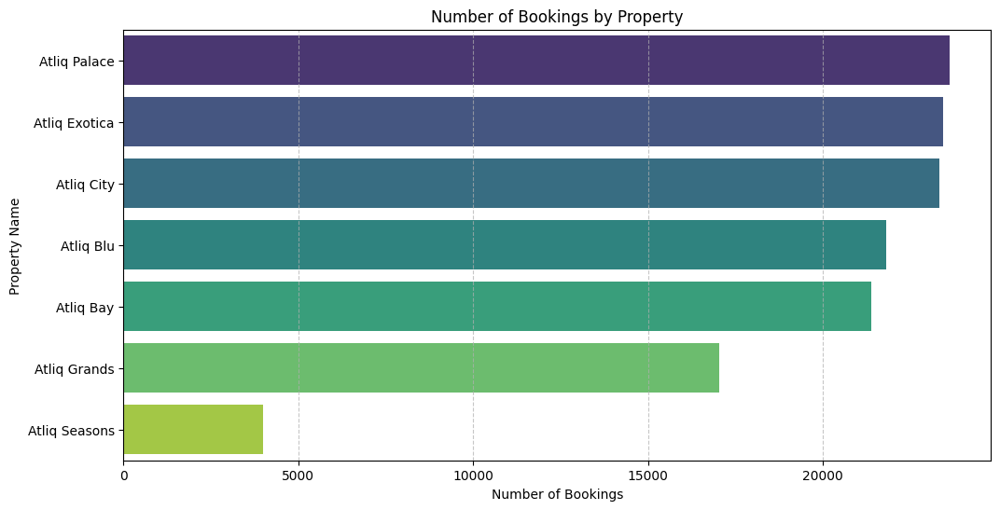

In [210]:
property_booking_counts = finaldata.groupby('property_name').size().reset_index(name='num_bookings')
plt.figure(figsize=(12, 6))
sns.barplot(x='num_bookings', y='property_name', data=property_booking_counts.sort_values(by='num_bookings', ascending=False), palette='viridis')
plt.title('Number of Bookings by Property')
plt.xlabel('Number of Bookings')
plt.ylabel('Property Name')
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.show()

Number of Bookings by City

/var/folders/yk/kfkgvzls1qq_b77_cc2x7y300000gn/T/ipykernel_7054/21503517.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='num_bookings', y='city', data=city_booking_counts.sort_values(by='num_bookings', ascending=False), palette='magma')


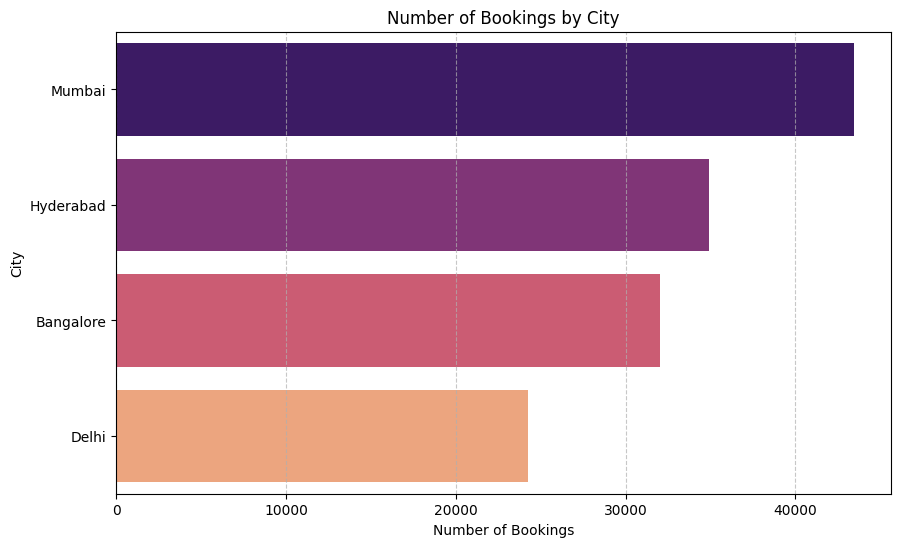

In [212]:
city_booking_counts = finaldata.groupby('city').size().reset_index(name='num_bookings')
plt.figure(figsize=(10, 6))
sns.barplot(x='num_bookings', y='city', data=city_booking_counts.sort_values(by='num_bookings', ascending=False), palette='magma')
plt.title('Number of Bookings by City')
plt.xlabel('Number of Bookings')
plt.ylabel('City')
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.show()

Comparison between Revenue Generated and Revenue Realized

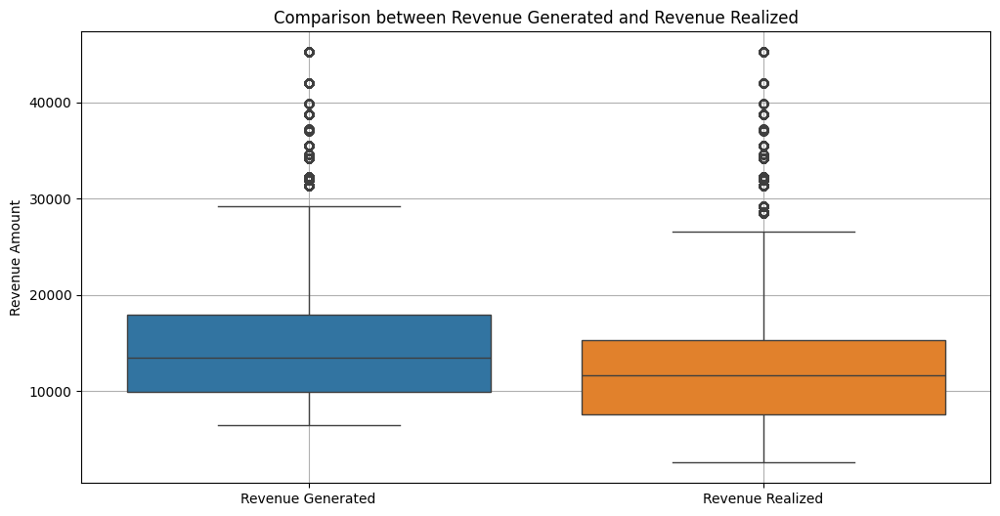

In [214]:
finaldata['revenue_generated'] = pd.to_numeric(finaldata['revenue_generated'], errors='coerce')
finaldata['revenue_realized'] = pd.to_numeric(finaldata['revenue_realized'], errors='coerce')
finaldata = finaldata.dropna(subset=['revenue_generated', 'revenue_realized'])
plt.figure(figsize=(12, 6))
sns.boxplot(data=data[['revenue_generated', 'revenue_realized']])
plt.title('Comparison between Revenue Generated and Revenue Realized')
plt.ylabel('Revenue Amount')
plt.xticks([0, 1], ['Revenue Generated', 'Revenue Realized'])
plt.grid(True)


plt.show()

Peak Booking Periods 

In [216]:
finaldata['booking_date'] = pd.to_datetime(finaldata['booking_date'], format='%d/%m/%Y')
finaldata['check_in_date'] = pd.to_datetime(finaldata['check_in_date'], format='%d/%m/%Y')
finaldata['checkout_date'] = pd.to_datetime(finaldata['checkout_date'], format='%d/%m/%Y')

finaldata['booking_month'] = finaldata['booking_date'].dt.month
finaldata['booking_day'] = finaldata['booking_date'].dt.day
finaldata['check_in_month'] = finaldata['check_in_date'].dt.month
finaldata['check_in_day'] = finaldata['check_in_date'].dt.day
finaldata['checkout_month'] = finaldata['checkout_date'].dt.month
finaldata['checkout_day'] = finaldata['checkout_date'].dt.day

booking_by_month = finaldata.groupby('booking_month').size().reset_index(name='num_bookings')
checkin_by_month = finaldata.groupby('check_in_month').size().reset_index(name='num_checkins')
checkout_by_month = finaldata.groupby('checkout_month').size().reset_index(name='num_checkouts')

booking_by_day = finaldata.groupby('booking_day').size().reset_index(name='num_bookings')
checkin_by_day = finaldata.groupby('check_in_day').size().reset_index(name='num_checkins')
checkout_by_day = finaldata.groupby('checkout_day').size().reset_index(name='num_checkouts')

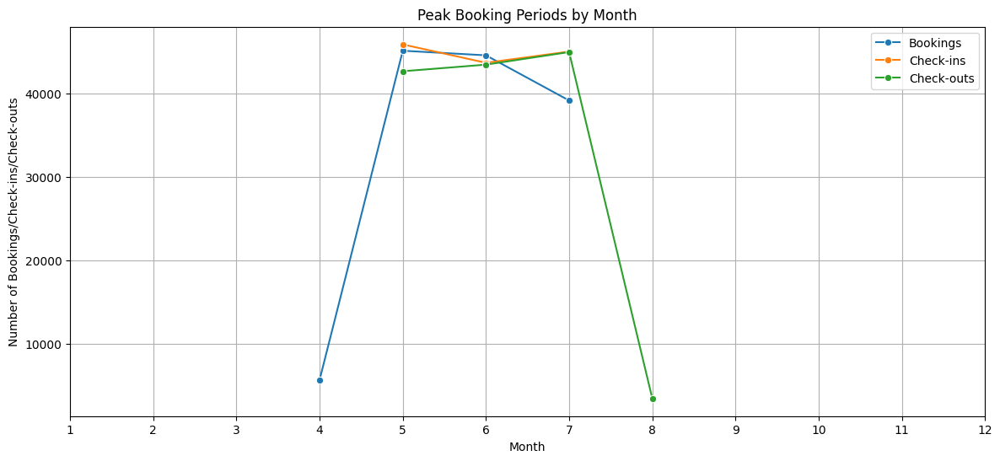

In [217]:
plt.figure(figsize=(14, 6))
sns.lineplot(x='booking_month', y='num_bookings', data=booking_by_month, marker='o', label='Bookings')
sns.lineplot(x='check_in_month', y='num_checkins', data=checkin_by_month, marker='o', label='Check-ins')
sns.lineplot(x='checkout_month', y='num_checkouts', data=checkout_by_month, marker='o', label='Check-outs')
plt.title('Peak Booking Periods by Month')
plt.xlabel('Month')
plt.ylabel('Number of Bookings/Check-ins/Check-outs')
plt.xticks(range(1, 13))
plt.grid(True)
plt.legend()
plt.show()

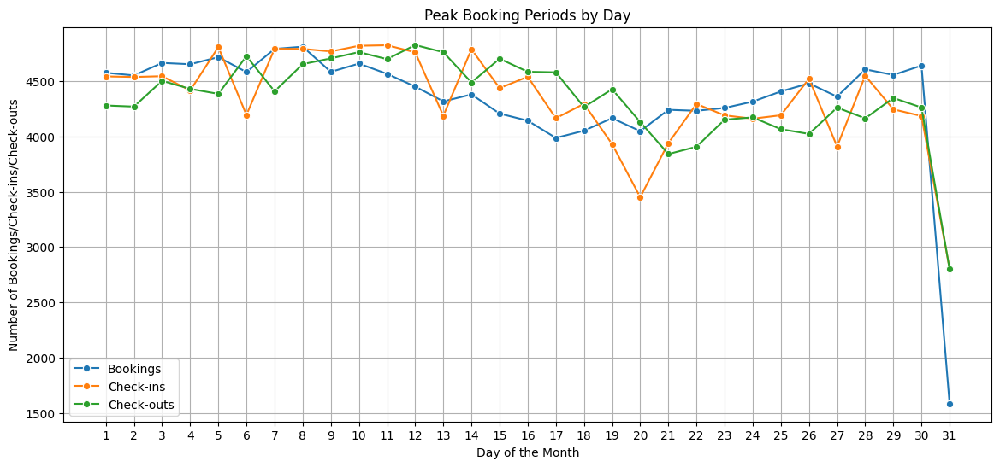

In [218]:
plt.figure(figsize=(14, 6))
sns.lineplot(x='booking_day', y='num_bookings', data=booking_by_day, marker='o', label='Bookings')
sns.lineplot(x='check_in_day', y='num_checkins', data=checkin_by_day, marker='o', label='Check-ins')
sns.lineplot(x='checkout_day', y='num_checkouts', data=checkout_by_day, marker='o', label='Check-outs')
plt.title('Peak Booking Periods by Day')
plt.xlabel('Day of the Month')
plt.ylabel('Number of Bookings/Check-ins/Check-outs')
plt.xticks(range(1, 32))
plt.grid(True)
plt.legend()
plt.show()

Popularity of Booking Platforms

/var/folders/yk/kfkgvzls1qq_b77_cc2x7y300000gn/T/ipykernel_7054/992007503.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=platform_counts.index, y=platform_counts.values, palette='viridis')


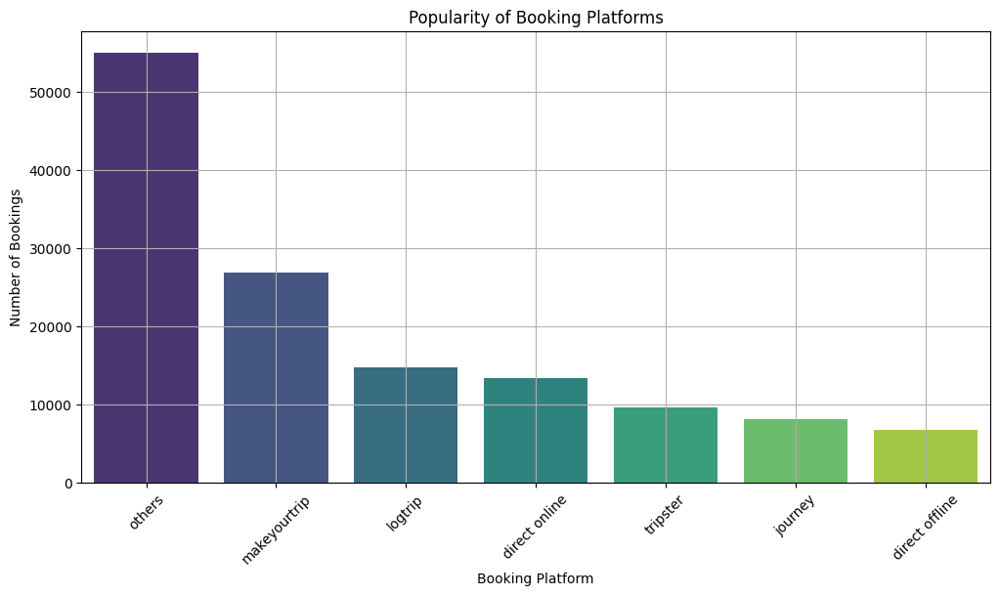

In [220]:
finaldata['booking_platform'] = finaldata['booking_platform'].astype(str).fillna('Unknown')
platform_counts = finaldata['booking_platform'].value_counts()
plt.figure(figsize=(12, 6))
sns.barplot(x=platform_counts.index, y=platform_counts.values, palette='viridis')
plt.title('Popularity of Booking Platforms')
plt.xlabel('Booking Platform')
plt.ylabel('Number of Bookings')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

Number of Guest per Booking

/var/folders/yk/kfkgvzls1qq_b77_cc2x7y300000gn/T/ipykernel_7054/1669217617.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=guest_counts.index, y=guest_counts.values, palette='magma')


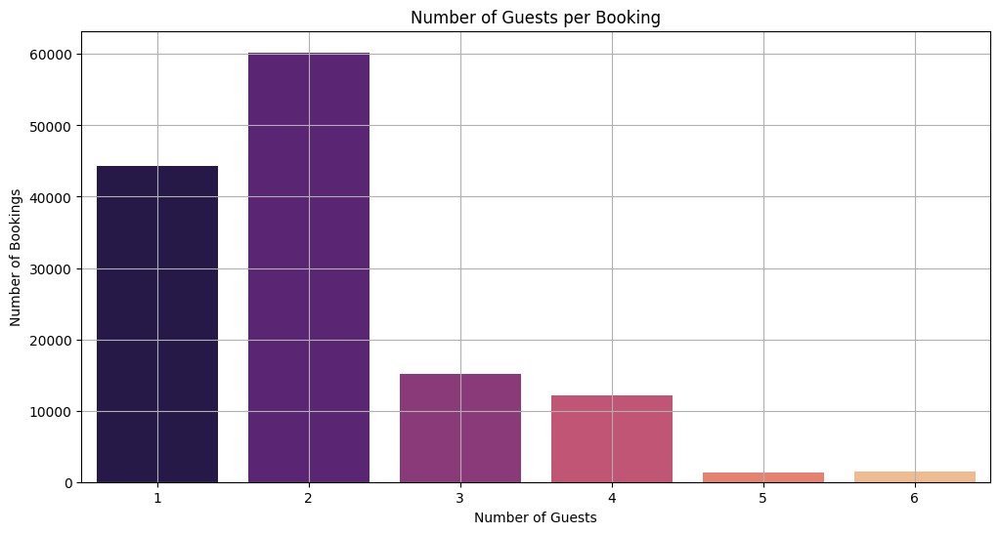

In [222]:
finaldata['no_guests'] = pd.to_numeric(finaldata['no_guests'], errors='coerce')
finaldata = data.dropna(subset=['no_guests'])
guest_counts = finaldata['no_guests'].value_counts().sort_index()
plt.figure(figsize=(12, 6))
sns.barplot(x=guest_counts.index, y=guest_counts.values, palette='magma')
plt.title('Number of Guests per Booking')
plt.xlabel('Number of Guests')
plt.ylabel('Number of Bookings')
plt.grid(True)
plt.show()

Distribution Of Ratings

/var/folders/yk/kfkgvzls1qq_b77_cc2x7y300000gn/T/ipykernel_7054/1065628107.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=rating_counts.index, y=rating_counts.values, palette='coolwarm')


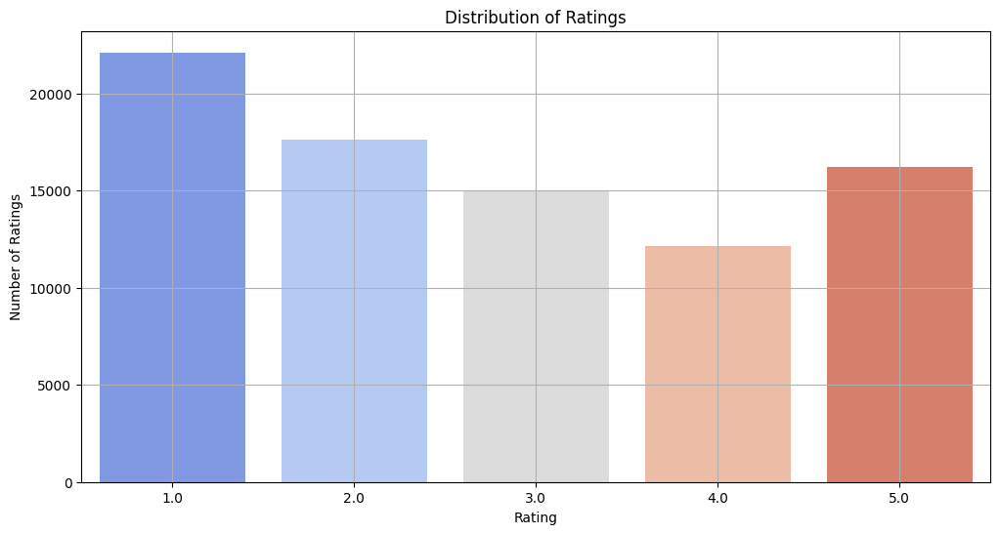

In [224]:
finaldata['ratings_given'] = pd.to_numeric(finaldata['ratings_given'], errors='coerce')
finaldata = finaldata.dropna(subset=['ratings_given'])
rating_counts = finaldata['ratings_given'].value_counts().sort_index()
plt.figure(figsize=(12, 6))
sns.barplot(x=rating_counts.index, y=rating_counts.values, palette='coolwarm')
plt.title('Distribution of Ratings')
plt.xlabel('Rating')
plt.ylabel('Number of Ratings')
plt.grid(True)
plt.show()

Total Revenue by Room Class

/var/folders/yk/kfkgvzls1qq_b77_cc2x7y300000gn/T/ipykernel_7054/384622273.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=revenue_summary, x='room_class', y='revenue_generated', ci=None)


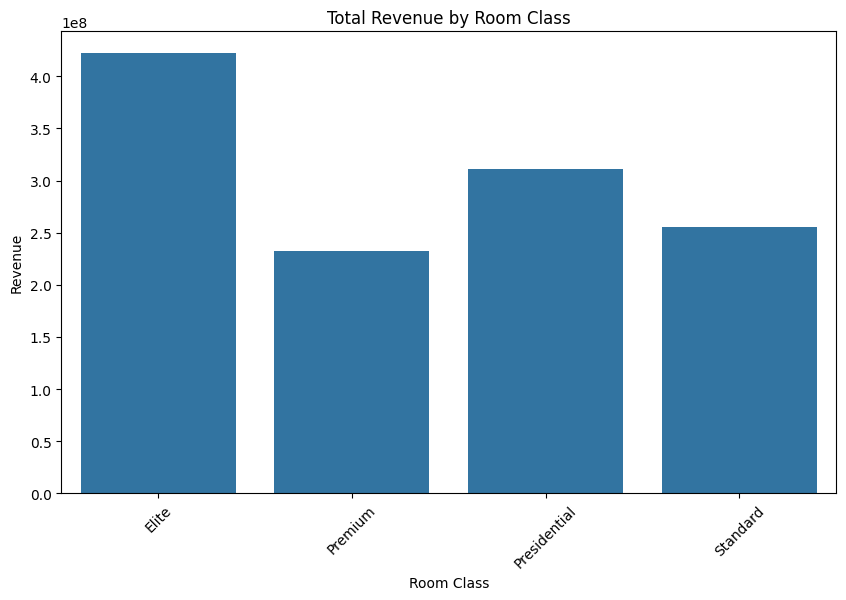

In [226]:
revenue_summary = finaldata.groupby(['room_class'])['revenue_generated'].sum().reset_index()
# Plot total revenue by room class
plt.figure(figsize=(10, 6))
sns.barplot(data=revenue_summary, x='room_class', y='revenue_generated', ci=None)
plt.title('Total Revenue by Room Class')
plt.ylabel('Revenue')
plt.xlabel('Room Class')
plt.xticks(rotation=45)
plt.show()

In [227]:
finaldata['cleaned_feedback'] = finaldata['feedback'].apply(preprocess_text)
finaldata.drop(columns=['feedback'], inplace=True)
finaldata['cleaned_canellation'] = finaldata['cancellations'].apply(preprocess_text)
finaldata.drop(columns=['cancellations'], inplace=True)
print(finaldata.columns)

Index(['booking_id', 'property_id', 'booking_date', 'check_in_date',
       'checkout_date', 'no_guests', 'room_id', 'booking_platform',
       'ratings_given', 'booking_status', 'revenue_generated',
       'revenue_realized', 'room_class', 'cleaned_feedback',
       'cleaned_canellation'],
      dtype='object')


Sentimental Analysis

In [229]:
finaldata['cleaned_canellation'] = finaldata['cleaned_canellation'].fillna('')
def get_sentiment(text):
    return TextBlob(text).sentiment.polarity
finaldata['cancellation_sentiment'] = finaldata['cleaned_canellation'].apply(get_sentiment)
average_cancellation_sentiment = finaldata['cancellation_sentiment'].mean()
print(f'Average Cancellation Sentiment: {average_cancellation_sentiment}')

Average Cancellation Sentiment: 0.0


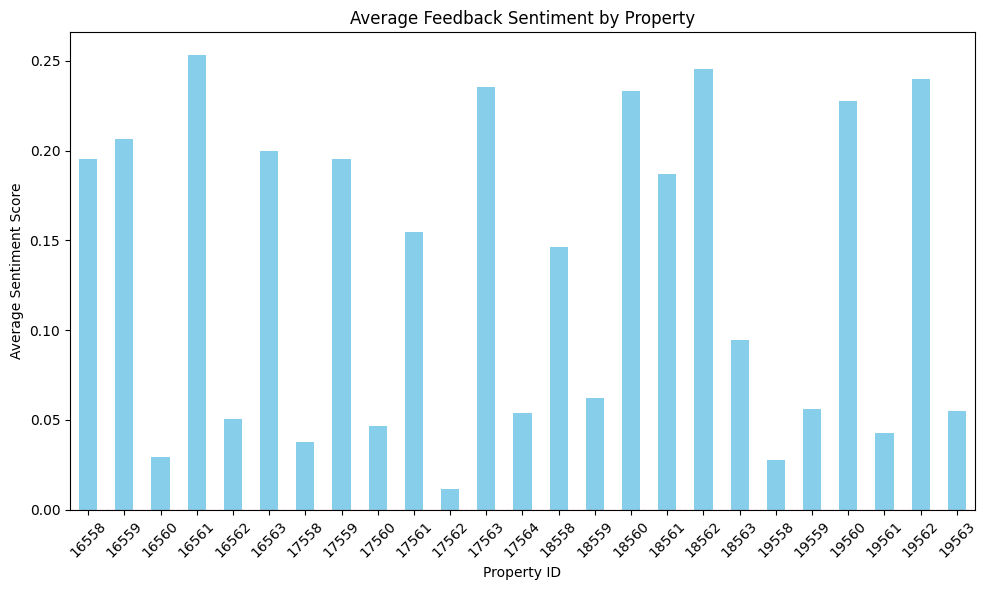

In [230]:
finaldata['cleaned_feedback'] = finaldata['cleaned_feedback'].fillna('')
sia = SentimentIntensityAnalyzer()
def get_sentiment(text):
    sentiment = sia.polarity_scores(text)
    return sentiment['compound']
finaldata['feedback_sentiment'] = finaldata['cleaned_feedback'].apply(get_sentiment)
average_feedback_sentiment_by_property = finaldata.groupby('property_id')['feedback_sentiment'].mean()
plt.figure(figsize=(10, 6))
average_feedback_sentiment_by_property.plot(kind='bar', color='skyblue')
plt.title('Average Feedback Sentiment by Property')
plt.xlabel('Property ID')
plt.ylabel('Average Sentiment Score')
plt.axhline(0, color='red', linewidth=0.8, linestyle='--')  
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Using Word Cloud

Anaylising over all feedback

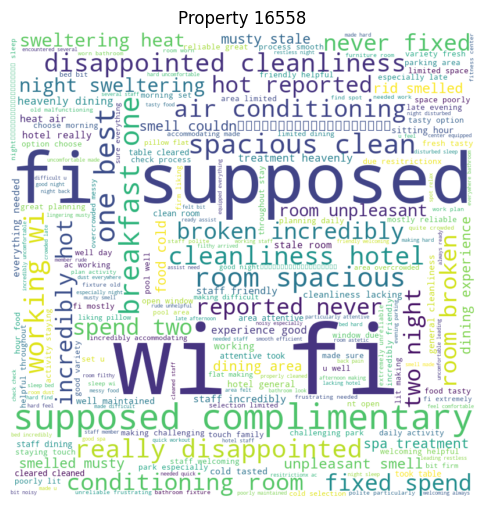

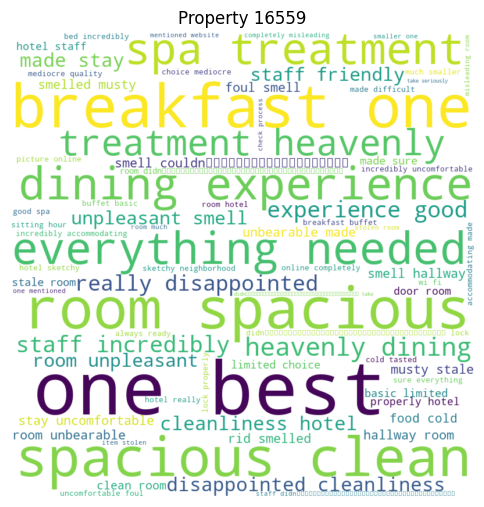

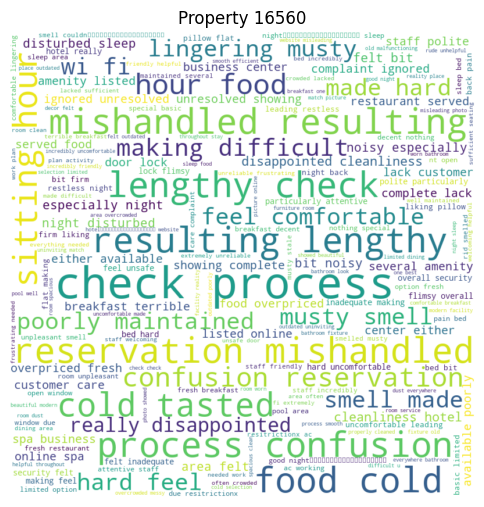

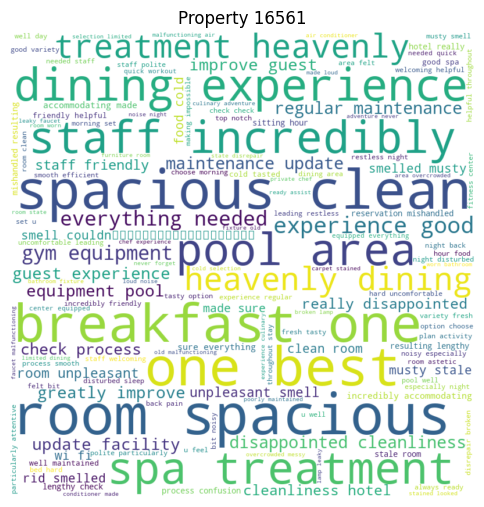

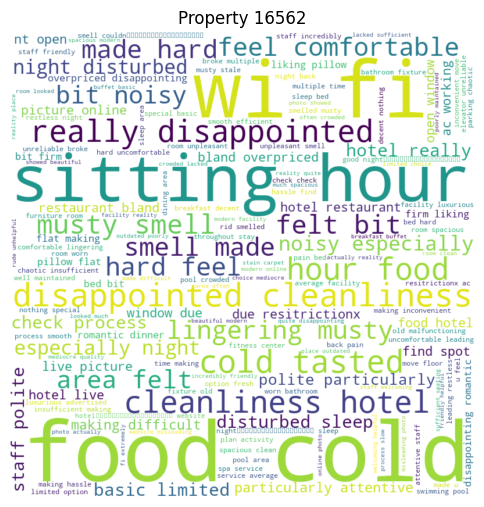

...

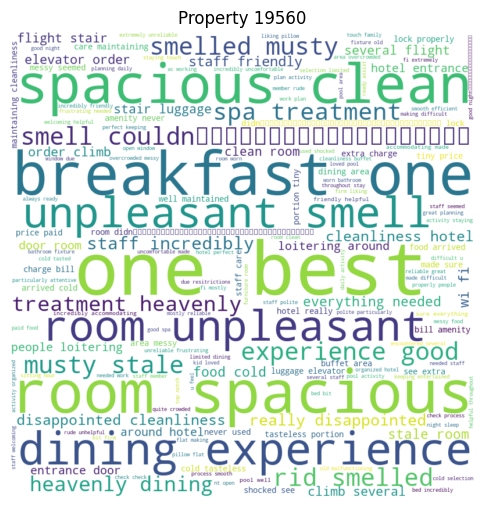

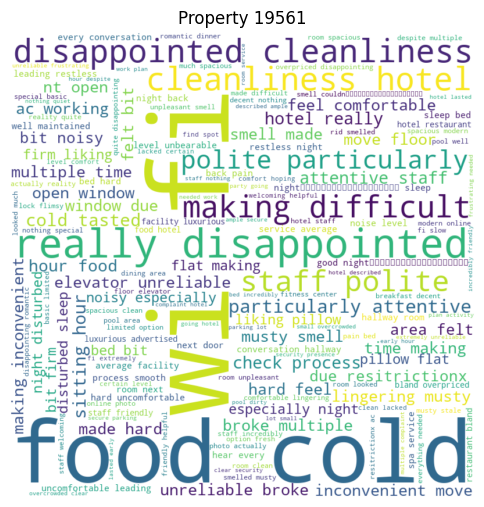

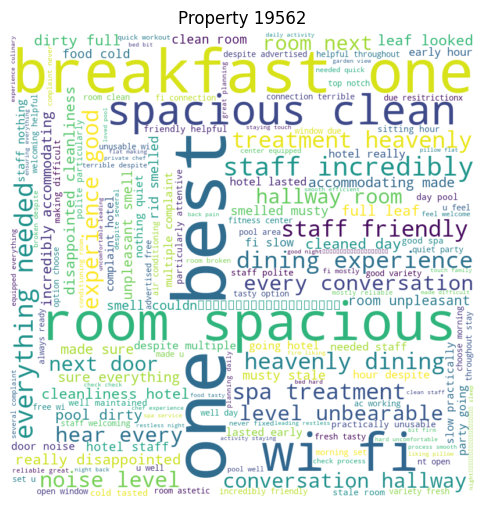

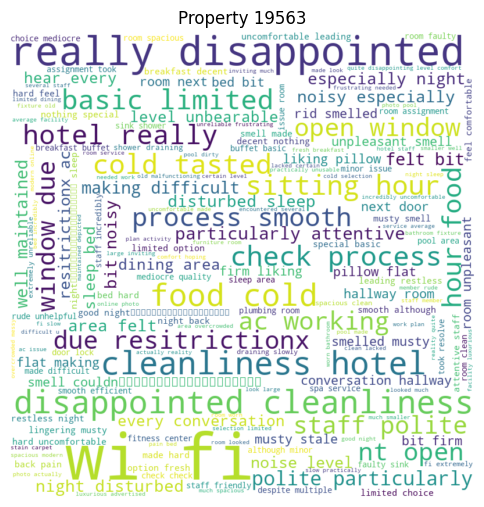

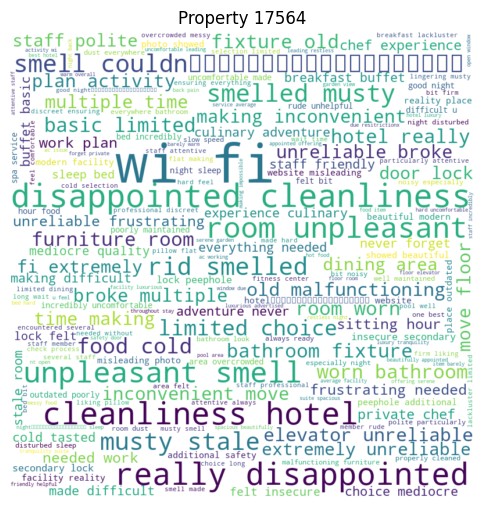

In [233]:
property_ids = finaldata["property_id"].unique()
for prop_id in property_ids:
    df_property = finaldata[finaldata["property_id"] == prop_id].copy()
    if df_property.empty:
        print(f"No data for property {prop_id}")
        continue
    df_property["cleaned_feedback"] = df_property["cleaned_feedback"].astype(str).fillna('')
    feedback_text = ' '.join(df_property["cleaned_feedback"])
    if len(feedback_text.strip()) == 0:
        print(f"No feedback text for property {prop_id}")
        continue
    wc1 = WordCloud(
        max_words=1000, 
        min_font_size=9, 
        height=800, 
        width=800,
        background_color="white"
    ).generate(feedback_text)
    plt.figure(figsize=(6, 8))
    plt.imshow(wc1, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Property {prop_id}')
    plt.show()

Analysing Ratings of each room

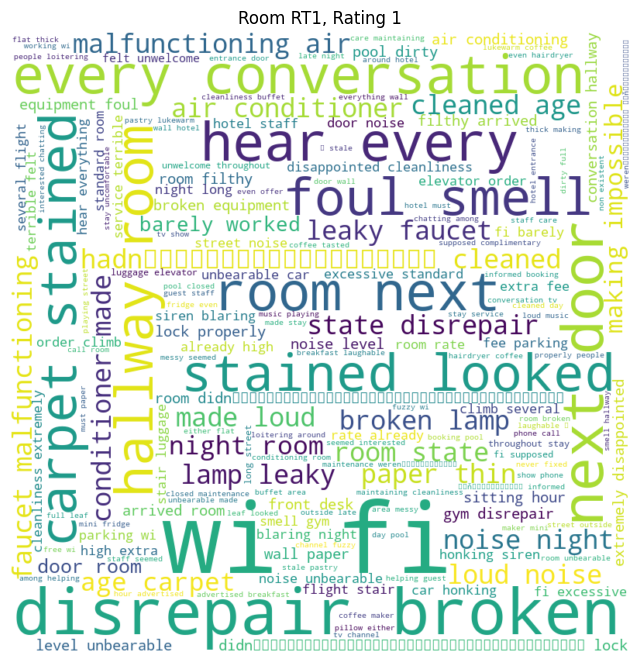

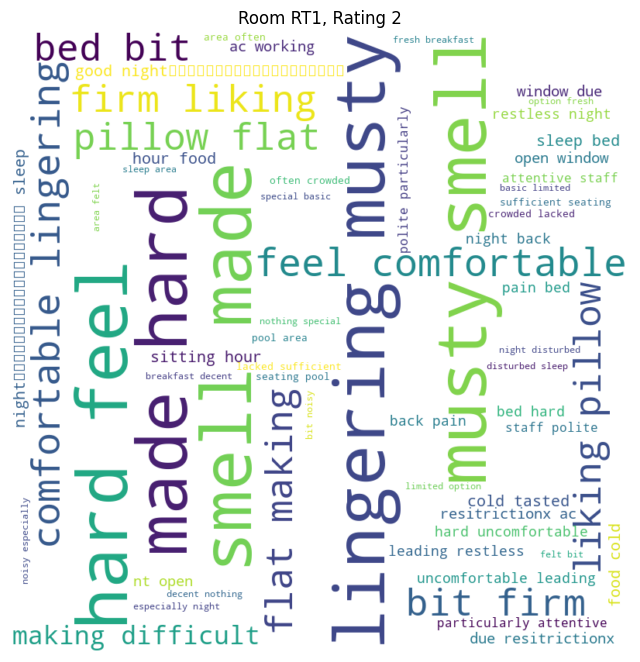

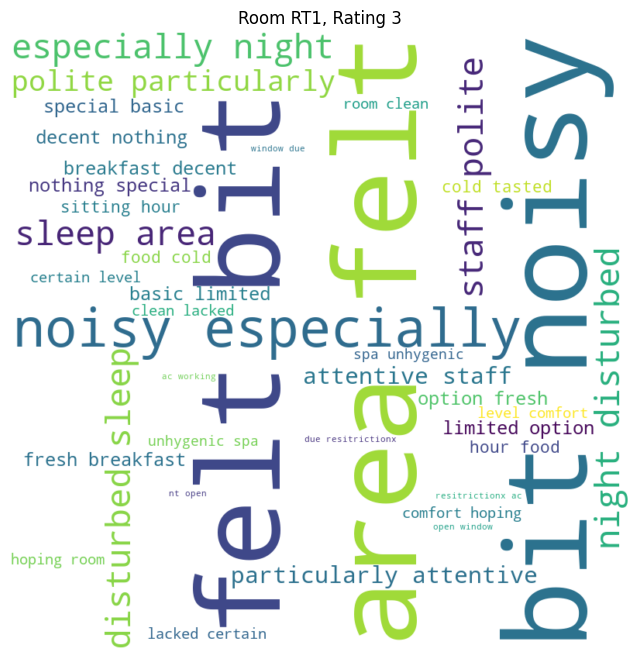

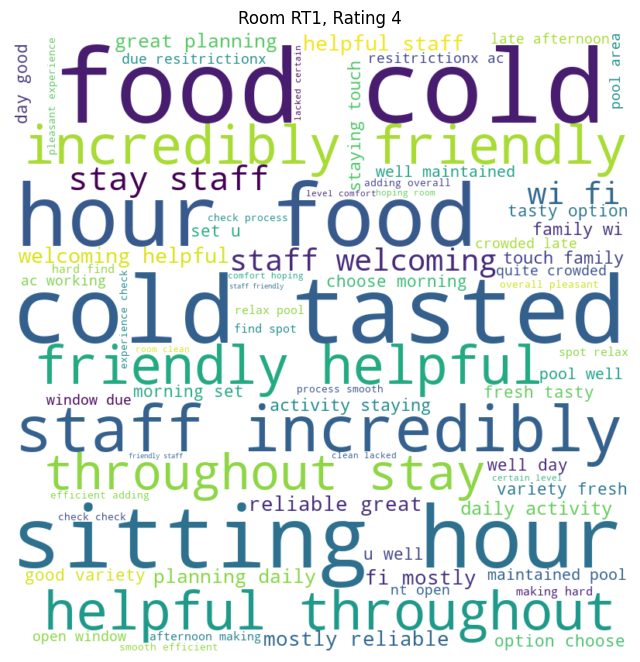

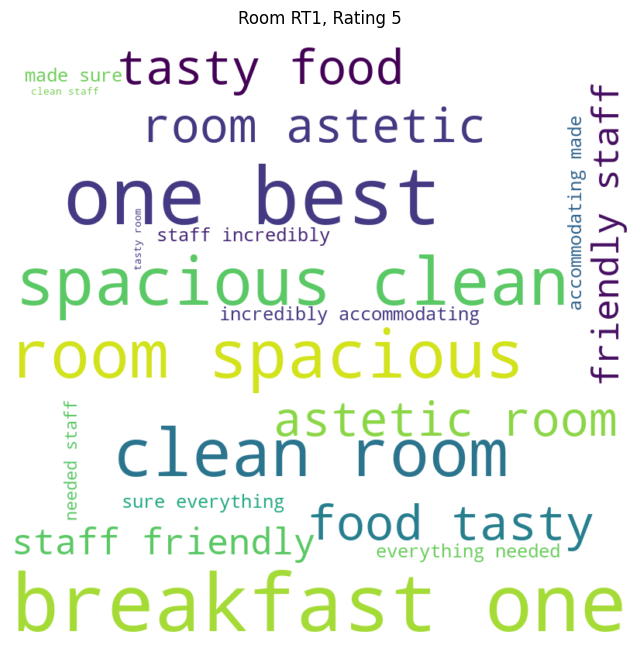

...

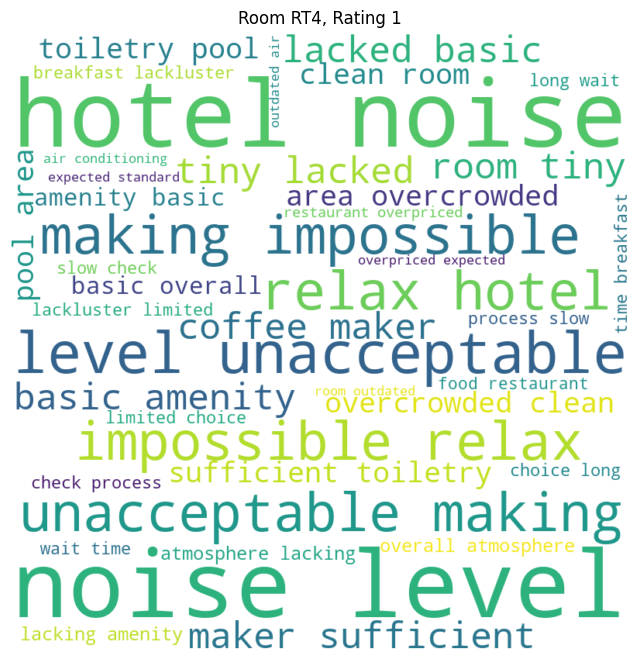

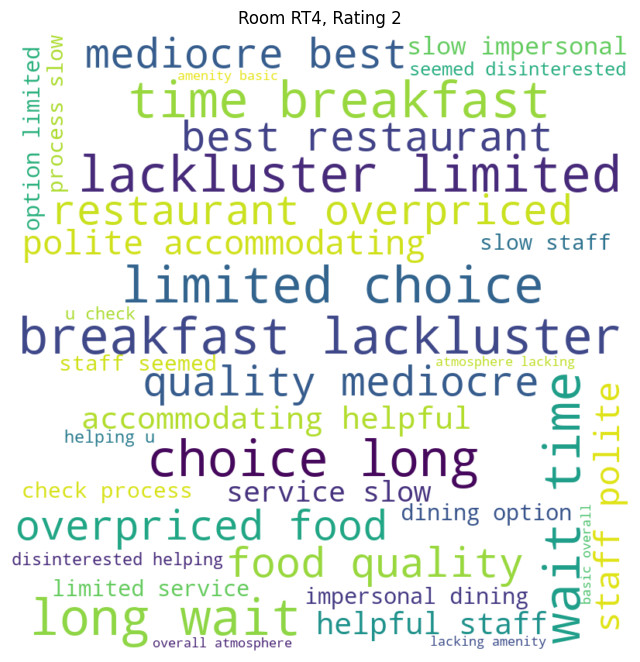

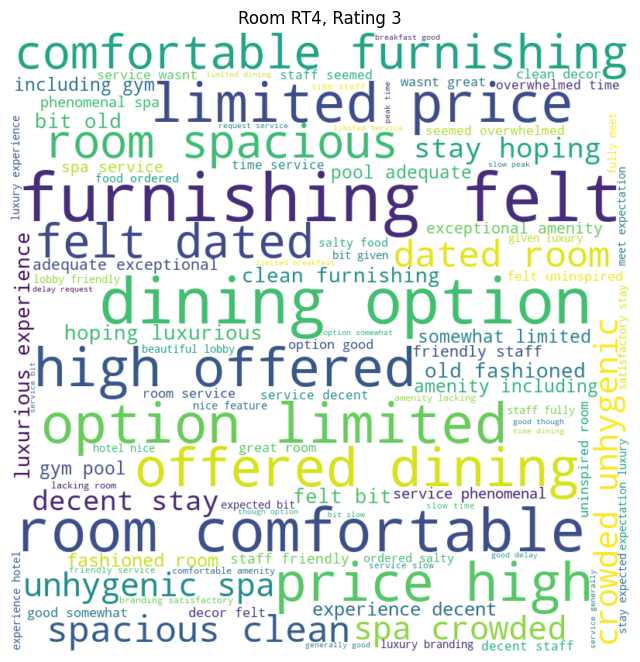

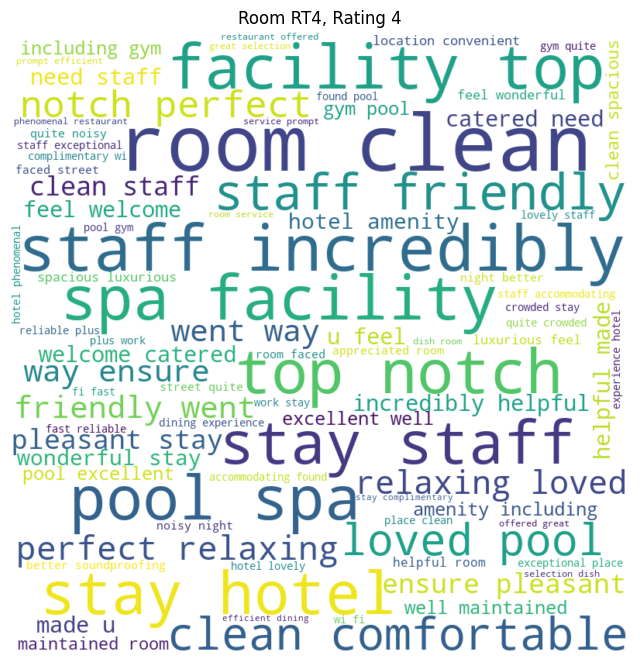

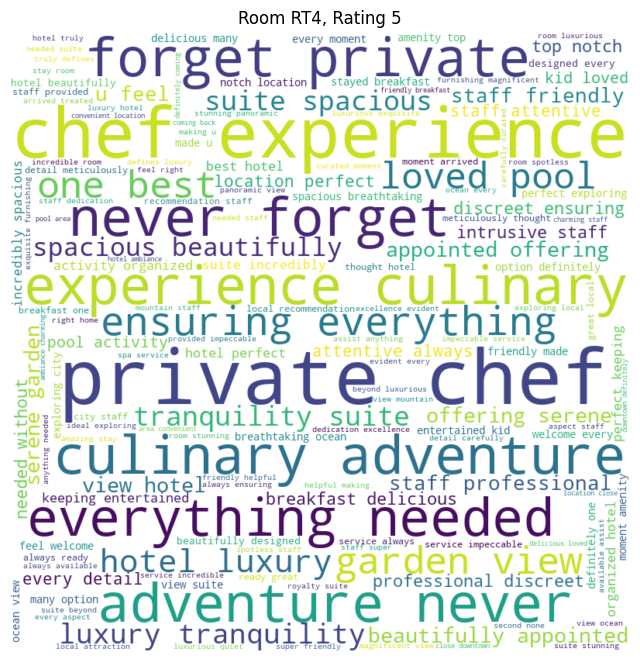

In [235]:
df_r = {}
df_r_ratings = {}
for i in range(5):
    df_r[i] = finaldata[finaldata["room_id"] == f'RT{i}'].copy()
    for r in range(6):
        df_r_ratings[(i, r)] = df_r[i][df_r[i]["ratings_given"] == r].copy()
        df_r_ratings[(i, r)]["cleaned_feedback"] = df_r_ratings[(i, r)]["cleaned_feedback"].astype(str).fillna('')
        df_r_ratings[(i, r)]["length"] = df_r_ratings[(i, r)]["cleaned_feedback"].apply(len)
        feedback_text = ' '.join(df_r_ratings[(i, r)]["cleaned_feedback"])
        if df_r_ratings[(i, r)].empty:
            continue
        wc1 = WordCloud(
            max_words=1000, 
            min_font_size=9, 
            height=800, 
            width=800,
            background_color="white"
        ).generate(feedback_text)
        plt.figure(figsize=(8, 10))
        plt.imshow(wc1, interpolation='bilinear')
        plt.axis('off')
        plt.title(f'Room RT{i}, Rating {r}')
        plt.show()

Cancellations

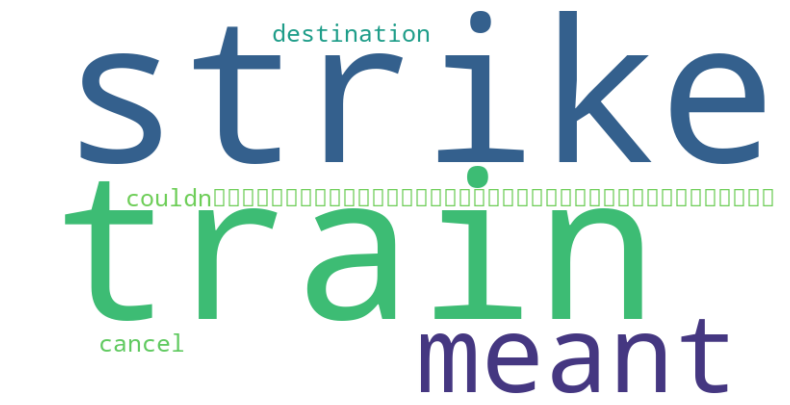

In [272]:
text = ' '.join(finaldata['cleaned_canellation'].dropna())
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off') 
plt.show()